# Task - 2
Take four original photos. Do all the following feature extraction on your photos.
1. Edge Detection
2. Corner Detection
3. Line Detection
4. Gabor Filter
    - i. Orientation: 0 degrees, Wavelength: 20
    - ii. Orientation: 0 degrees, Wavelength: 80
    - iii. Orientation: 90 degrees, Wavelength: 30
    - iv. Orientation:150 degrees, Wavelength: 10
5. Discrete Wavelet Transform

In [1]:
# Loading required packages

import cv2                       ## cv2 for processing image files
import numpy as np               ## numpy for performing mathematical operations on array data structure
import matplotlib.pyplot as plt  ## for plotting images on the same notebook file instead of using separate window 

In [13]:
# Loading four images

img1 = cv2.imread('image1.jpg') 
img2 = cv2.imread('image2.jpg')
img3 = cv2.imread('image3.jpg')
img4 = cv2.imread('image4.jpg') 

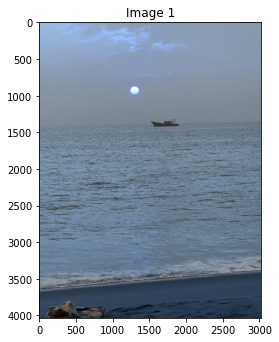

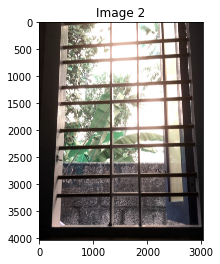

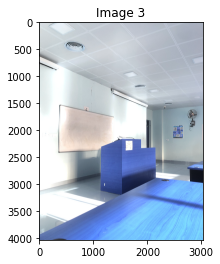

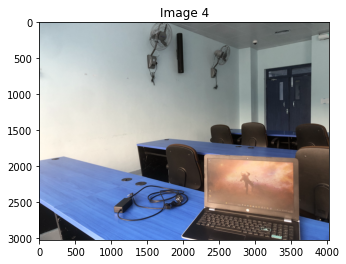

In [14]:
# Showing images

## setting figure canvas size
fig = plt.figure(figsize=(25, 25))

## Enumerate used to loop through list and get counter as list index of corresponding element
for i, img in enumerate([img1, img2, img3, img4]):
    ## plotting original images in single canvas
    fig.add_subplot(4, 1, i+1)
    ## title
    title = 'Image '+str(i+1)
    plt.title(title)
    ## showing image
    plt.imshow(img)
    plt.show()

## 1. Edge Detection

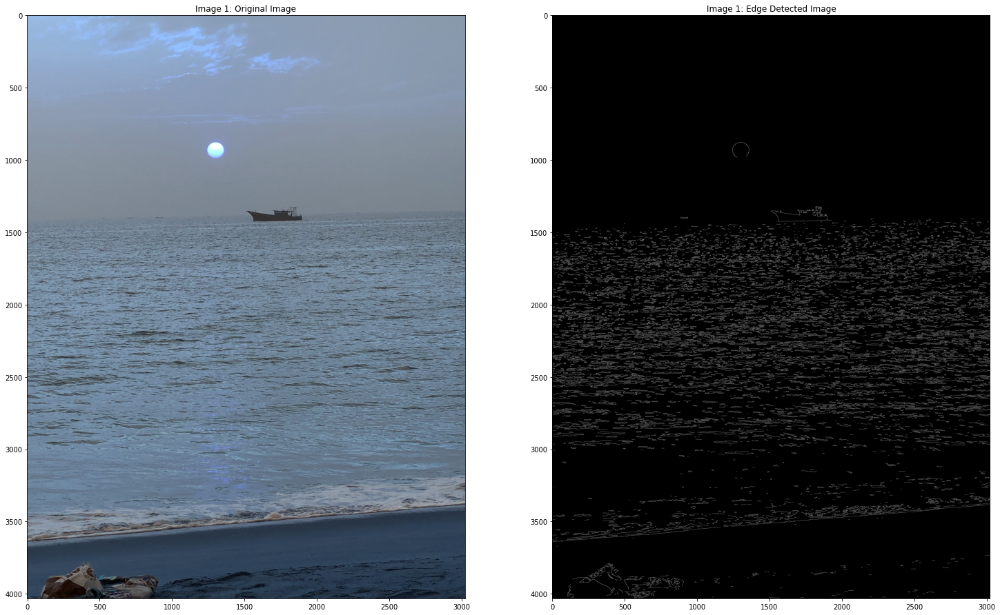

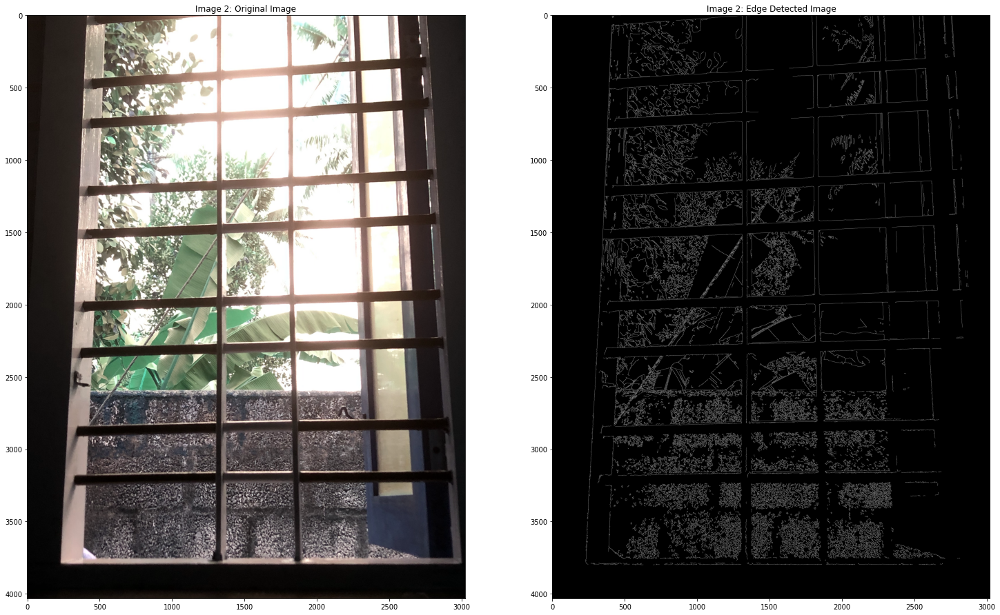

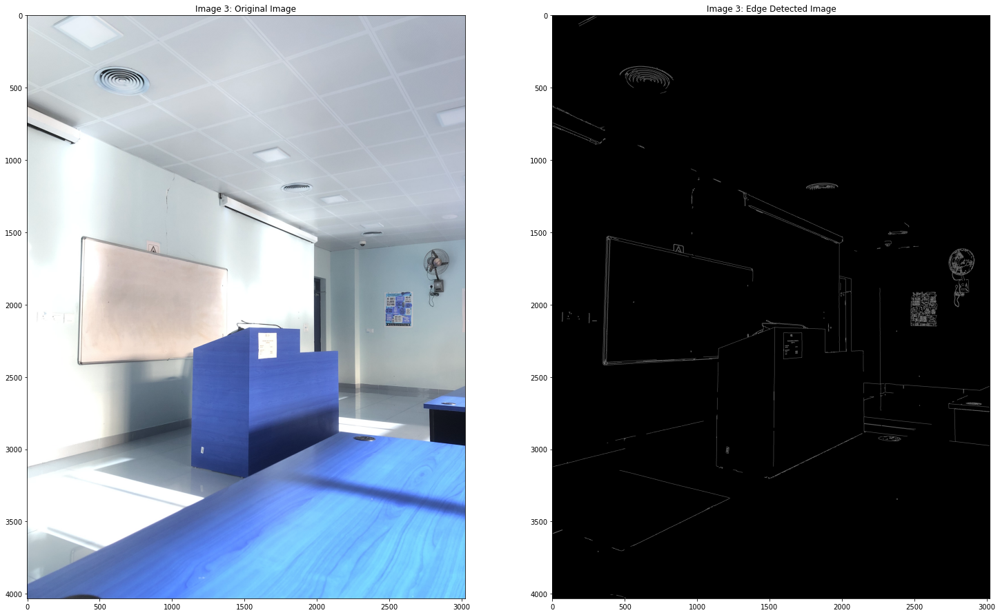

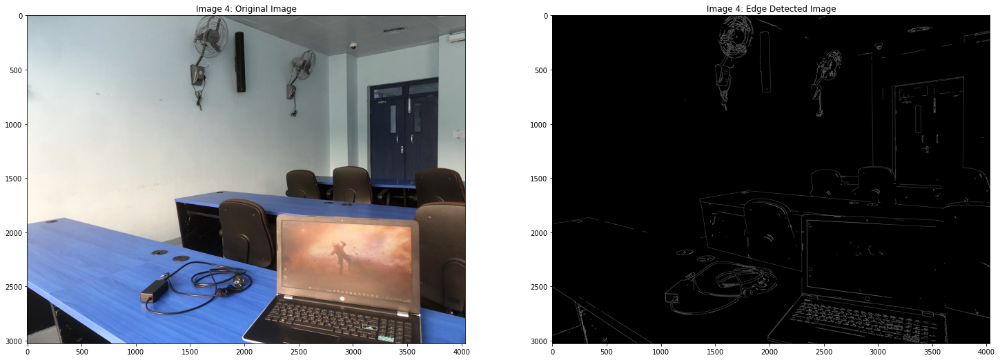

In [5]:
# Canny edge detection

# Performing edge detection and diplaying detection iteratively to all imges that stacked on a list.
## Enumerate used to loop through list and get counter as list index of corresponding element
for i, img in enumerate([img1, img2, img3, img4]): 
    ## coverting raw color image into grayscale image 
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    ## Here we use Canny edge detection technique.
    ## Applying Canny cv2 method. It is used to detect the edges in an image; it takes a gray scale image as input, 
    ## using a multistage algorithm it output image array having detected edges.
    edges = cv2.Canny(gray_img, 100, 200)
    ## The methode Canny() take first argument as grayscaled image, second(100) and thired(200) values specify Hysteresis
    ## threshold values; minmum and maximum threshold value of intensity gradient to consider which are really edges 
    ## out out all detected edges. Edge below min threshold discarded and between min and max is considere based on edge
    ## connectivity with edge that are above max threshold.
    
    ## plotting original and detected images
    ## setting figure canvas size
    plt.figure(figsize=(25, 25))
    
    ## setting subplot position for 1st image in a row
    plt.subplot(121)
    ## image plot title
    title1 = 'Image '+str(i+1)+': Original Image'
    plt.title(title1)
    ## showing original image in gray backgroud
    plt.imshow(img)
    
    ## setting subplot position for 2st figure in a row
    plt.subplot(122)
    ## image plot title
    title2 = 'Image '+str(i+1)+': Edge Detected Image'
    plt.title(title2)
    ## showing detected image in gray backgroud
    plt.imshow(edges, cmap = 'gray')
    
    ## showing entire figure canvas
    plt.show()

Ref: https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html

### 2. Corner Detection

In [6]:
# Defining function for corner detection
def detect_corner(img):
    '''
    This function perform corner detection using Harris Corner detection algorithm.
    input argument  - img: raw input image.
    output return   - img: image array embed with corner points.
    '''
    
    ## coverting color image into grayscale image 
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ## converting image dtype from 'uint8' to 'float32' for applying cornerHarris method. 
    gray_img = np.float32(gray_img)
    
    ## applying cornerHarris method on image. It runs the Harris corner detector algoriythm on the image and return an array.
    corners = cv2.cornerHarris(gray_img, 4, 3, 0.04)
    ## Here, cornerHarris take image array as 1st argument, size of neighbourhood as 2nd argument, Sobel kernal size (a) and 
    ## a Harris detector free parameter as last argument
    
    ## result is dilated for marking the corners
    corners = cv2.dilate(corners,None)
    ## To spot corner; filtering out values with a threshold and assigning red color to the corner,
    ## it may vary depending on the image.
    img[corners>0.01*corners.max()]=[255,0,0]
    
    ## return output image
    return img

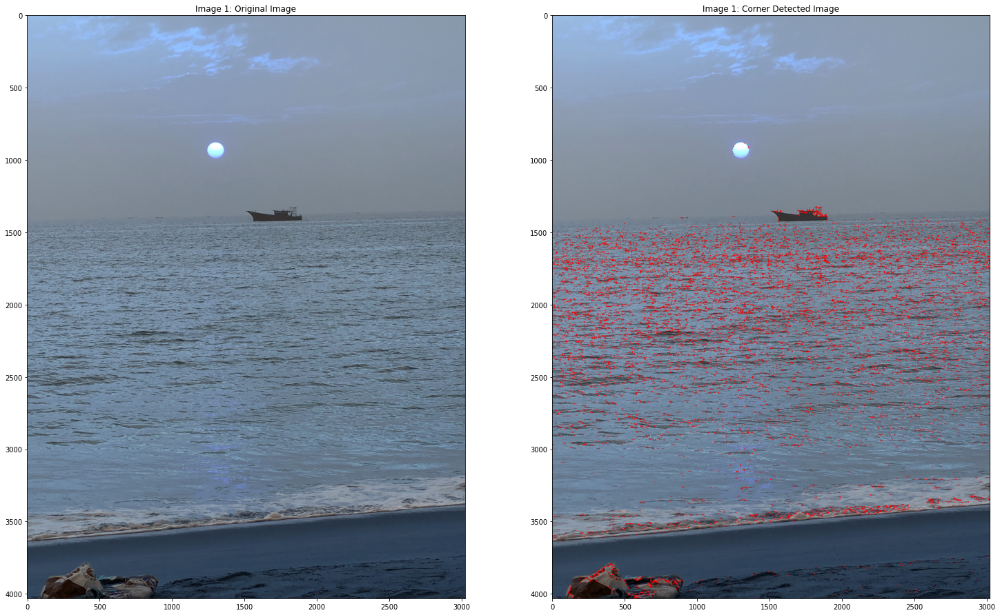

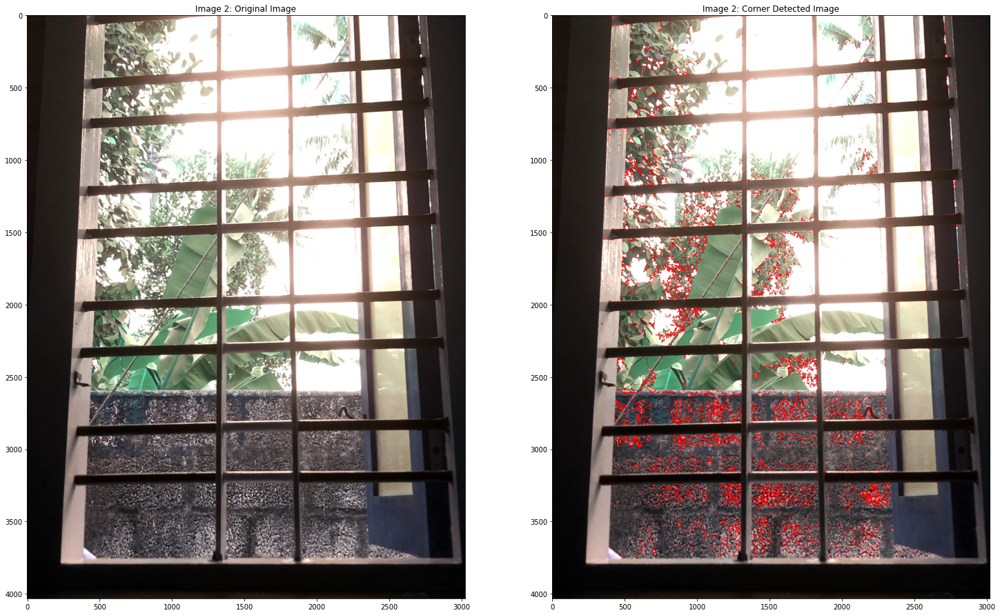

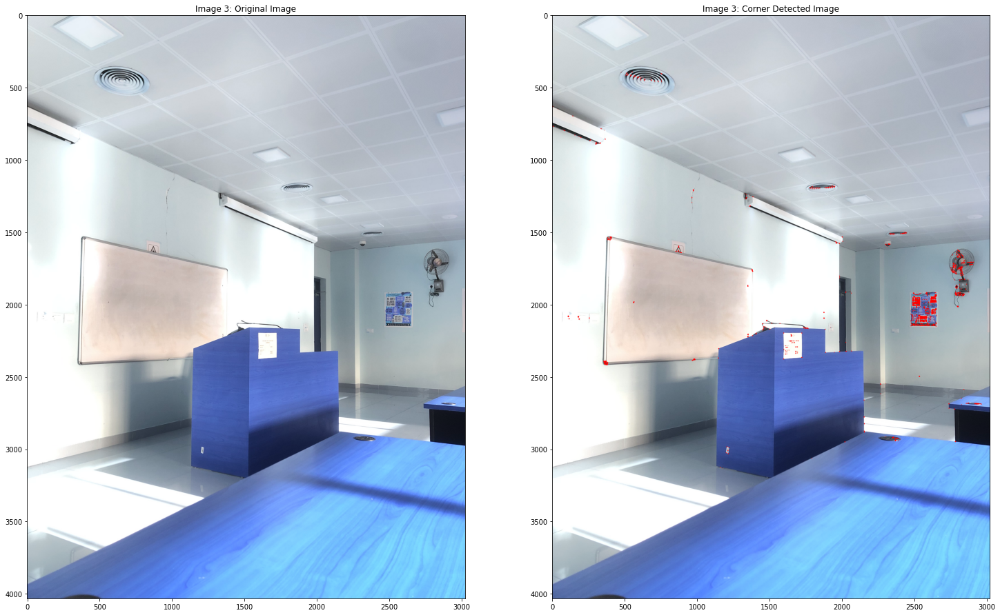

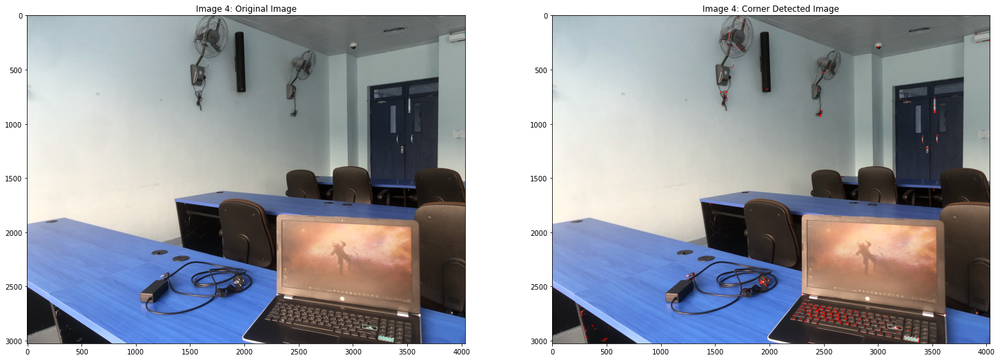

In [7]:
# Performing corner detection and displaying detection iteratively to all imges that stacked on a list.

## Enumerate used to loop through list and get counter as list index of corresponding element
for i, img in enumerate([img1, img2, img3, img4]):
    
    # since corner detection carried on spotting corner on image itself, creating a copy to which spotting will be done.
    img_copy = img.copy()
    
    # calling 'detect_corner' function on image.
    det_img = detect_corner(img_copy)
    
    ## Plotting original and detected images
    ## setting figure canvas size
    plt.figure(figsize=(25, 25))
    
    ## setting subplot position for 1st figure in a row
    plt.subplot(121)
    ## image plot title
    title1 = 'Image '+str(i+1)+': Original Image'
    plt.title(title1)
    ## showing original image in gray backgroud
    plt.imshow(img, cmap = 'gray')
    
    ## setting subplot position for 2st figure in a row
    plt.subplot(122)
    ## image plot title
    title2 = 'Image '+str(i+1)+': Corner Detected Image'
    plt.title(title2)
    ## showing detected image in gray backgroud
    plt.imshow(det_img, cmap = 'gray')
    
    ## showing entire figure canvas
    plt.show()

Ref: https://docs.opencv.org/3.4/dc/d0d/tutorial_py_features_harris.html

### 3. Line Detection

In [8]:
# Defining 'detect_line' function.
def detect_line(img):
    '''
    This function perform line detection. It fist do edge detection then Hough Line transformation algorithm to detect lines.
    input argument  - img: raw input image.
    output return   - img: image array embed with lines.
    '''
    
    ## coverting color image into grayscale image
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    ## Edge detection
    edge = cv2.Canny(gray_img, 150, 200, apertureSize=3)
    
    ## Applying Hough Line Transform. This method take edge detected image array and return output vector of lines.
    img_lines = cv2.HoughLines(edge, 1, np.pi/180, 150)
    ## Here, 1st argument is image array 'edge', 2nd is distance resolution parameter; rho (here use 1 pixel ), 3rd is
    ## Angle resolution parameter theta (in radian) and last one is a threshold indicate minimum number of intersections to detect
    ## a line.
    
    ## Drawing the lines on image
    if img_lines is not None:
        ## if there is any detected lines, then
        ## iterating through img_lines to draw all line
        for line in img_lines:
            rho, theta = line[0]
            ## collecting rho and theta for each image
            a = np.cos(theta)
            b = np.sin(theta)
            ## line cordinates
            x0 = a * rho
            y0 = b * rho
            
            ## 1st point of line segment
            pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
            ## 2nd point of line segment
            pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
            
            ## drawing a line segment connecting two points.
            cv2.line(img, pt1, pt2, (255,0,0), 2)
            ## It takes image, 2 points of line segment, color (here red) and thickness respectively.
            
    ## return output image
    return img

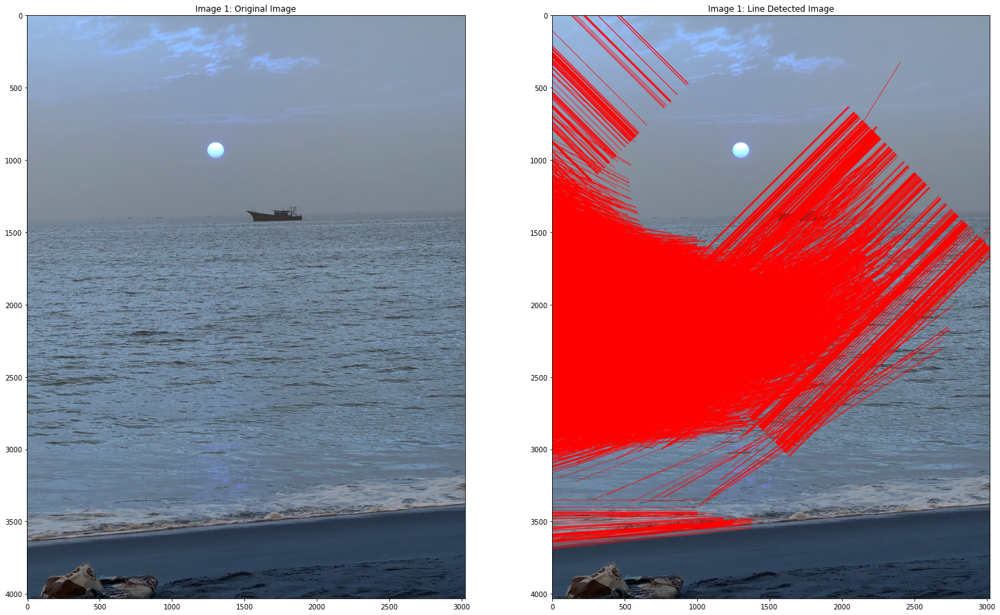

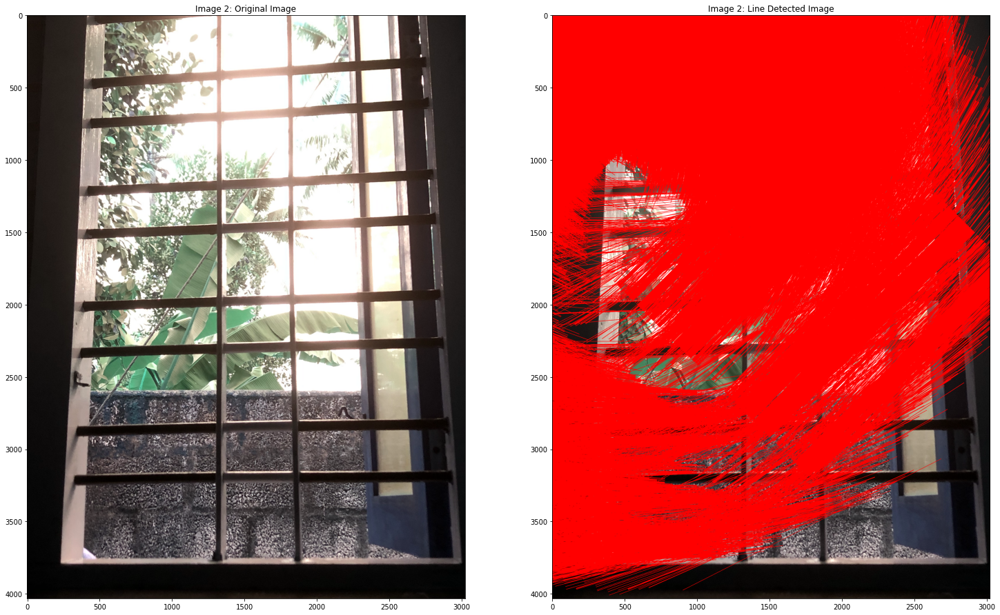

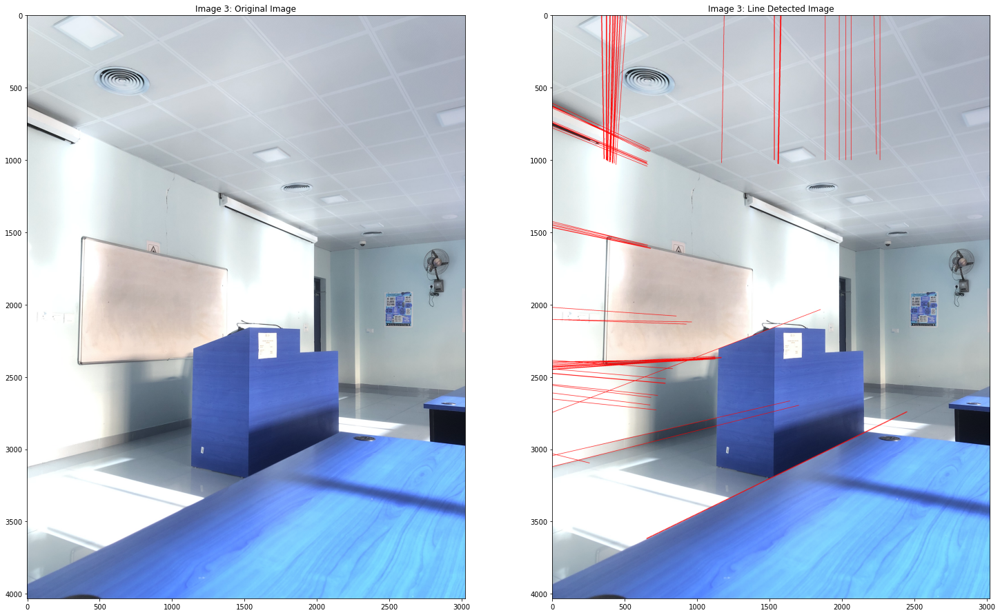

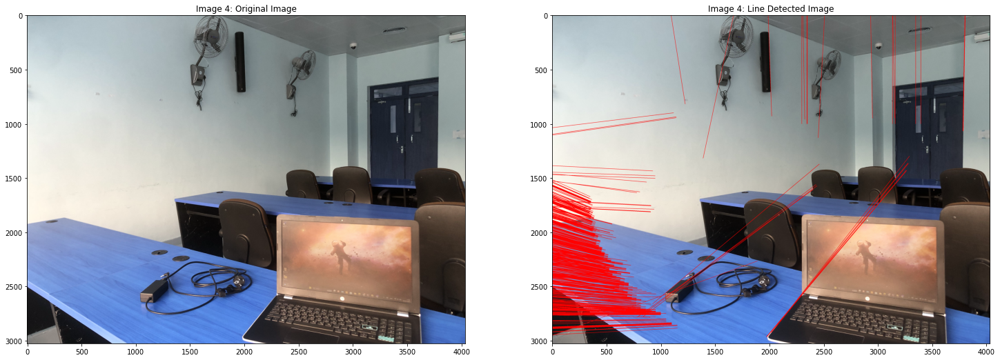

In [9]:
# Performing line detection and displaying detection iteratively to all imges that stacked on a list.

## Enumerate used to loop through list and get counter as list index of corresponding element
for i, img in enumerate([img1, img2, img3, img4]):
    
    ## creating a copy from which line will be detected.
    img_copy = img.copy()
    
    ## calling 'detect_line' function on image.
    det_img = detect_line(img_copy)
    
    ## Plotting original and detected images
    ## setting figure canvas size
    plt.figure(figsize=(25, 25))
    
    ## setting subplot position for 1st figure in a row
    plt.subplot(121)
    ## image plot title
    title1 = 'Image '+str(i+1)+': Original Image'
    plt.title(title1)
    ## showing original image in gray backgroud
    plt.imshow(img, cmap = 'gray')
    
    ## setting subplot position for 2st figure in a row
    plt.subplot(122)
    ## image plot title
    title2 = 'Image '+str(i+1)+': Line Detected Image'
    plt.title(title2)
    ## showing detected image in gray backgroud
    plt.imshow(det_img, cmap = 'gray')
    
    ## showing entire figure canvas
    plt.show()

Ref: https://docs.opencv.org/3.4/d9/db0/tutorial_hough_lines.html

## 4. Gabor Filter
    - i. Orientation: 0 degrees, Wavelength: 20
    - ii. Orientation: 0 degrees, Wavelength: 80
    - iii. Orientation: 90 degrees, Wavelength: 30
    - iv. Orientation:150 degrees, Wavelength: 10
    

In [10]:
def generate_gabor():
    # This function is designed to produce a set of GaborFilters  
    ## empty list to store generated filters
    filters = []   
    ## local area to evaluate
    ksize = 35      
    ## Larger Values produce more edges
    sigma = 3.0
    lambda_vals = [20, 80, 30, 10]
    gamma = 0.5
    ## Offset value - lower generates cleaner results
    psi = 0 
    ## Theta is the orientation for edge detection
    theta_vals = [0, 0, 90, 150]
    
    for i in range(len(theta_vals)):
        kern = cv2.getGaborKernel((ksize, ksize), sigma, theta_vals[i], lambda_vals[i], gamma, psi, ktype=cv2.CV_64F)
        ## Brightness normalization
        kern /= 1.0 * kern.sum()
        filters.append(kern)
        
    return filters

In [11]:
def apply_gfilters(img, filters):
    # This general function is designed to apply filters to our image
     
    # First create a numpy array the same size as our input image
    newimage = np.zeros_like(img)
     
    # Starting with a blank image, we loop through the images and apply our Gabor Filter
    # On each iteration, we take the highest value (super impose), until we have the max value across all filters
    # The final image is returned
    depth = -1 # remain depth same as original image
     
    for kern in filters:  # Loop through the kernels in our GaborFilter
        image_filter = cv2.filter2D(img, depth, kern)  #Apply filter to image
         
        # Using Numpy.maximum to compare our filter and cumulative image, taking the higher value (max)
        np.maximum(newimage, image_filter, newimage)
    return newimage

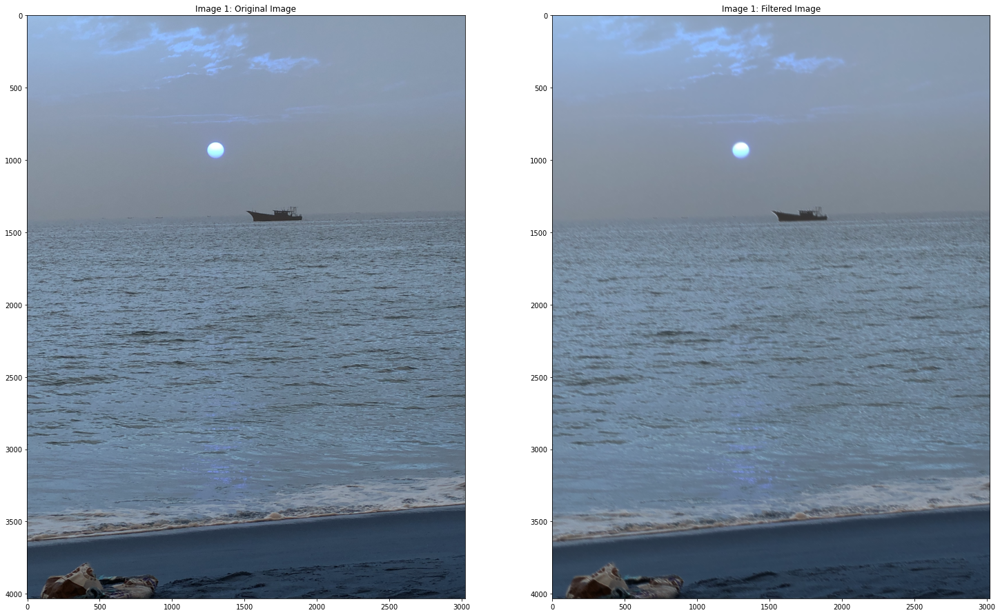

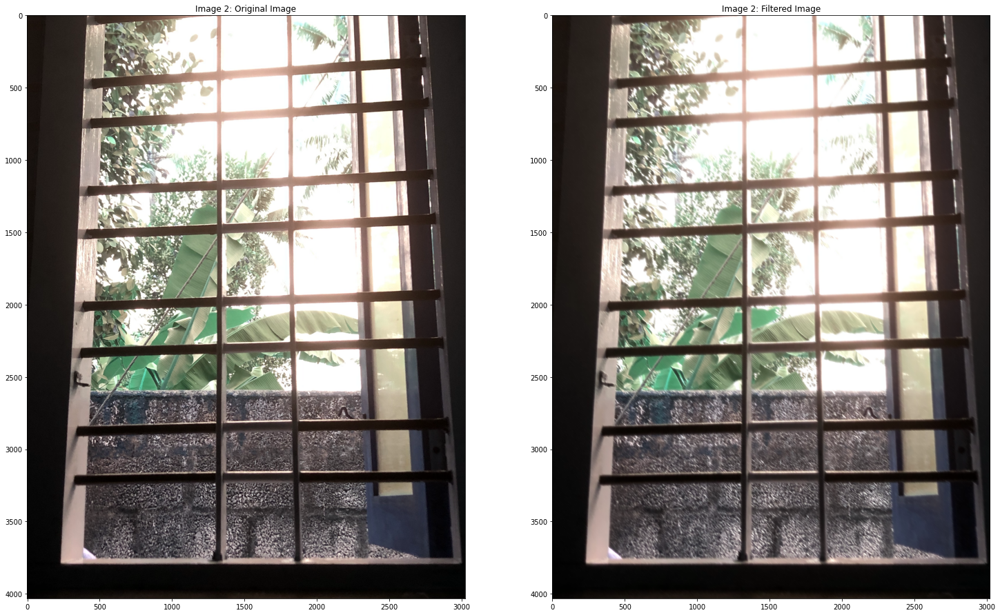

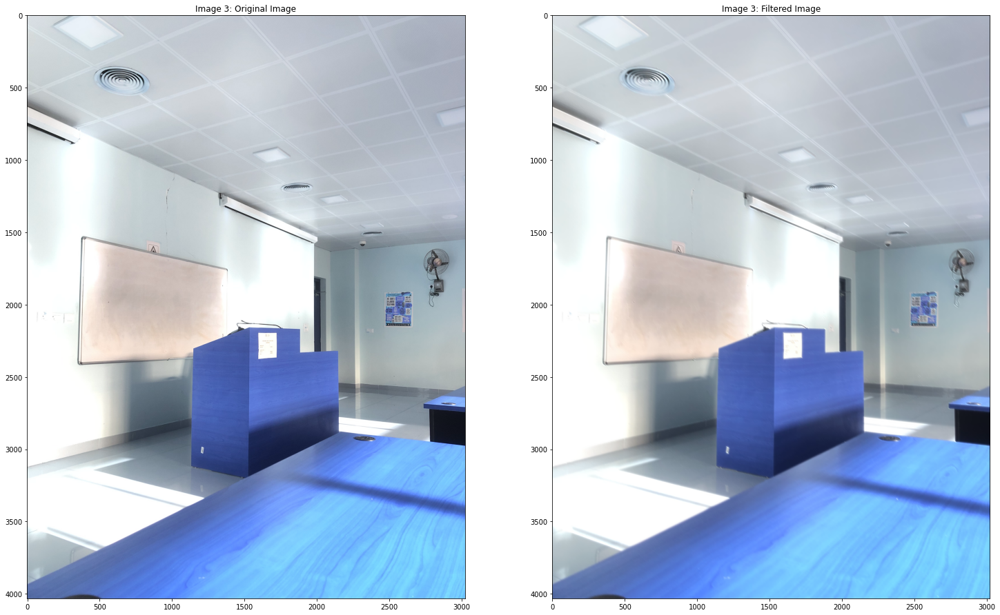

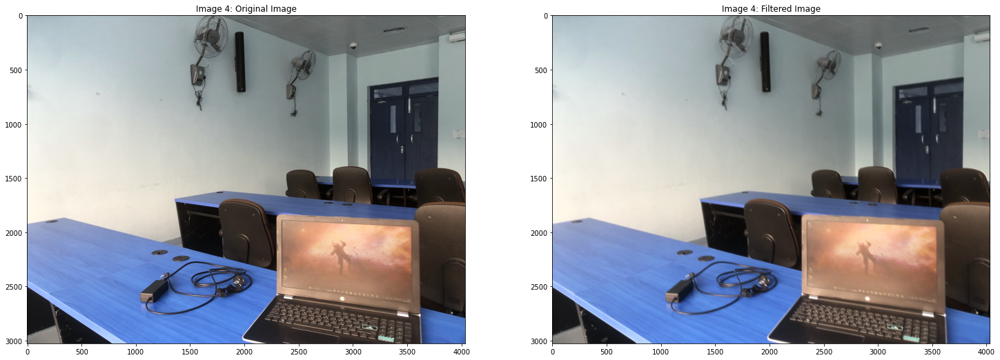

In [12]:
# Applying Gabor filters and displaying iteratively to all imges that stacked on a list.

## call 'generate_gabor' function to generate filters
gfilters = generate_gabor()
## Enumerate used to loop through list and get counter as list index of corresponding element
for i, img in enumerate([img1, img2, img3, img4]):
    
    ## creating a copy to which filter will be applied.
    img_copy = img.copy()
    
    ## calling 'apply_gfilters' function on image.
    filtered_img = apply_gfilters(img_copy, gfilters)
    
    ## Plotting original and filtered images
    ## setting figure canvas size
    plt.figure(figsize=(25, 25))
    
    ## setting subplot position for 1st figure in a row
    plt.subplot(121)
    ## image plot title
    title1 = 'Image '+str(i+1)+': Original Image'
    plt.title(title1)
    ## showing original image in gray backgroud
    plt.imshow(img, cmap = 'gray')
    
    ## setting subplot position for 2st figure in a row
    plt.subplot(122)
    ## image plot title
    title2 = 'Image '+str(i+1)+': Filtered Image'
    plt.title(title2)
    ## showing filtered image in gray backgroud
    plt.imshow(filtered_img, cmap = 'gray')
    
    ## showing entire figure canvas
    plt.show()

Ref: https://www.freedomvc.com/index.php/2021/10/16/gabor-filter-in-edge-detection/

## 5. Discrete Wavelet Transform